In [1]:

import cv2
import easyocr
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from IPython.display import display
import google.generativeai as genai
from dotenv import load_dotenv
import os
import json
from rapidfuzz import fuzz
import re


load_dotenv()
reader = easyocr.Reader(['en'])  # Initialize once


c:\Users\funel\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


In [34]:
class DefaultResultHolder:
    def __init__(self):
        self.dest_start = 0
        self.dest_end = 0

def draw_ocr_annotations(image_path, results, output_path="ocr_annotated.png"):
    image = cv2.imread(image_path)
    for bbox, text, _ in results:
        pts = np.array(bbox, dtype=np.int32)
        pts = pts.reshape((-1, 1, 2))
        y_top = bbox[0][1]
        y_bottom = bbox[2][1]
        height = abs(y_bottom - y_top)
        cv2.polylines(image, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        x, y = pts[0][0]
        cv2.putText(image, f"{text} : {height}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    cv2.imwrite(output_path, image)
    print(f"✅ Annotated image saved: {output_path}")
    display(Image.open(output_path))
    return output_path

def draw_annotations_from_json(image_path, json_data, fx=1.0, fy=1.0, output_path="annotated_articles.png"):
    import json
    import cv2
    from PIL import Image

    # Load image
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"❌ Could not load image from: {image_path}")

    # Parse JSON
    try:
        articles = json.loads(json_data)
    except json.JSONDecodeError:
        raise ValueError("❌ Invalid JSON data")

    # Define annotation types and colors
    parts = {
        "headline": ((255, 0, 0), 2),       # Blue
        "subheadline": ((0, 255, 0), 2),    # Green
    }

    for article in articles.get("values", []):
        article_type = article.get("type")
        bbox = article.get("box_2d") or article.get("bounding_box") or article.get("bbox")

        if article_type in parts and bbox and len(bbox) == 4:
            color, thickness = parts[article_type]

            x1, y1, x2, y2 = bbox  # Assume bbox = [x1, y1, x2, y2]
            x1 = int(x1 / fx)
            y1 = int(y1 / fy)
            x2 = int(x2 / fx)
            y2 = int(y2 / fy)

            top_left = (x1, y1)
            bottom_right = (x2, y2)

            # Draw rectangle and label
            cv2.rectangle(image, top_left, bottom_right, color, thickness)
            cv2.putText(
                image,
                article_type.capitalize(),
                (x1, y1 - 10),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                color,
                2
            )

    cv2.imwrite(output_path, image)
    Image.open(output_path).show()
    return output_path

def normalize_text(s):
    return " ".join(s.lower().split())


def remove_single_line_from_target(best_result, main_text):
    # # Remove spaces only for matching purposes
    # pattern = r"[,'\"]"
    # target_text = re.sub(pattern, "", target_text)
    # substring = re.sub(pattern , "", substring)
    # target_no_space = "".join(target_text.split()).lower()
    # substring_no_space = "".join(substring.split()).lower()

    # # Find the index of the match in the no-space version
    # idx = target_no_space.find(substring_no_space)
    # if idx == -1:
    #     return target_text  # no match, return unchanged

    # # Map index back to the original string
    # count = 0
    # start = None
    # end = None
    # for i, ch in enumerate(target_text):
    #     if ch != " ":
    #         if count == idx:
    #             start = i
    #         if count == idx + len(substring_no_space) - 1:
    #             end = i
    #             break
    #         count += 1

    # # Remove the matching segment from the original text
    # if start is not None and end is not None:
    #     return (target_text[:start] + target_text[end+1:]).strip()
    new_result = main_text[best_result.dest_start:best_result.dest_end]
    return main_text.replace(new_result, "")

def find_bbox_for_gemini_text(target_text, ocr_results, lowest_bbox=0):
    print("\n\n\n")
    target_norm = target_text
    best_match = []
    best_score = 0
    text_match = ""
    best_result = DefaultResultHolder()
    best_height = 0
    multiple_text_match = []
    multiple_height_match = []
    # Try single lines first
    for bbox, ocr_text, conf in ocr_results:
        if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6" and "Corp" in ocr_text:
            print(f"Single Line Result: {ocr_text}")
        if len(ocr_text) >= 4 and len(ocr_text) - len(target_norm) <= 5:
            ocr_norm = ocr_text
            result = fuzz.partial_ratio_alignment(ocr_norm, target_norm)
            score = result.score
            current_height = abs(bbox[0][1] - bbox[2][1])
            if score > 85 and best_height < current_height:
                best_height = current_height
                best_match = [bbox]
                text_match = ocr_text
                best_result = result
                break
    if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
        print(f"Best Single Line: {text_match}")
    # Check if there is a bigger height for that text
    for bbox, ocr_text, conf in ocr_results:
        result = fuzz.partial_ratio_alignment(ocr_text, text_match)
        current_height = abs(bbox[0][1] - bbox[2][1])
        if len(ocr_text) >= 4 and len(ocr_text) - len(text_match) <= 5: # 5 is the threshold to limit the quantity of characters
            score = result.score
            if score > 95 and best_height < current_height:
                best_height = current_height
                best_match = [bbox]
                text_match = ocr_text
                best_result = result
    
    if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
        print(f"Best Single Line (after height): {text_match}")
    # Try multi-line combinations
    new_target_text = remove_single_line_from_target(best_result, target_norm)
    if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
        print(f"Best Multiple text match (after height): {multiple_text_match}")
    if text_match.strip() == "":
        return None, 0, lowest_bbox
    multiple_text_match.append(text_match)
    multiple_height_match.append(best_height)
    print(f"Best Single Line: {multiple_text_match[0]}\nBest Height: {multiple_height_match[0]}")
    print(f"New Target Text: {new_target_text}")
    for i in range(len(ocr_results)):
        combined_text = ocr_results[i][1]
        combined_bbox = ocr_results[i][0]
        if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
            print(f"Ocr Result: {combined_text}")
        match_found = False
        match_idx = None
        combined_height = abs(combined_bbox[0][1] - combined_bbox[2][1])
        for i in range(1, len(multiple_text_match)):
            if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
                print(multiple_text_match[i])
            match_ratio = fuzz.partial_ratio_alignment(combined_text, multiple_text_match[i])
            if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
                print(match_ratio.score)
            if match_ratio.score > 80 and combined_height > multiple_height_match[i]:
                match_found = True
                match_idx = i
                break
        if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
                print(f"Length of {new_target_text} : {len(new_target_text)}")
                print(f"Length of {combined_text} : {len(combined_text)}")
        
        if match_found:
                # Plus 1 is because single line match already occupies first index
                multiple_text_match[match_idx] = combined_text
                best_match[match_idx] = combined_bbox
                multiple_height_match[match_idx] = combined_height
                continue
        if (len(new_target_text) >= len(combined_text) and len(combined_text) >= 4):
            combined_bboxes = best_match[:]
            combined_bboxes.append(combined_bbox)
            best_result = fuzz.partial_ratio_alignment(combined_text, new_target_text)
            score = best_result.score
            if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
                print(score)
            if score >= 90:
                best_score = score
                best_match = combined_bboxes[:]
                text_match += combined_text
                multiple_text_match.append(combined_text)
                if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
                    print(f"Multiple Text Match: {multiple_text_match}")
                multiple_height_match.append(combined_height)
                new_target_text = remove_single_line_from_target(best_result, new_target_text)
                if target_text == "Senate vote to continue or junk VP impeach trial set for Aug. 6":
                    print(f"New Target Text: {new_target_text}")
              
    if not best_match:
        return None, 0, lowest_bbox

    # Merge bboxes into one rectangle
    all_points = np.vstack(best_match)
    x_min, y_min = np.min(all_points, axis=0)
    x_max, y_max = np.max(all_points, axis=0)

    # ✅ update lowest bbox using bottom of rectangle
    lowest_bbox = y_min

    return [int(x_min), int(y_min), int(x_max), int(y_max)], best_score, lowest_bbox




def draw_annotations_from_gemini_with_ocr(image_path, gemini_json, ocr_results, fx=1.0, fy=1.0, output_path="annotated.png"):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image {image_path}")

    articles = gemini_json.get("values", [])
    colors = {
        "headline": (255, 0, 0),       # Blue
        "subheadline": (0, 255, 0)     # Green
    }

    # Final data format
    grouped_results = {"values": [] }
    current_group = None  # to hold the active headline+subheadline pairing
    lowest_bbox = 0
    for article in articles:
        text = article.get("text", "") or article.get("text_content", "")
        article_type = article.get("type", "").lower()
        bbox, score, lowest_bbox = find_bbox_for_gemini_text(text, ocr_results, lowest_bbox)
        if bbox:
            # Scale coords
            scaled_bbox = [int(coord / fx) for coord in bbox]
            # Draw on image
            color = colors.get(article_type, (255, 255, 255))
            x1, y1, x2, y2 = scaled_bbox
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, f"{article_type} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

            # Store in grouped results
            if article_type == "headline":
                # Start a new group
                if current_group:
                    grouped_results["values"].append(current_group)
                current_group = {
                    "headline": text,
                    "subheadline": None,
                    "headline_coord": scaled_bbox,
                    "subheadline_coord": None
                }

            elif article_type == "subheadline":
                # Attach to current group if it exists
                if current_group:
                    current_group["subheadline"] = text
                    current_group["subheadline_coord"] = scaled_bbox
                else:
                    # If no headline before, create standalone entry
                    current_group = {
                        "headline": None,
                        "subheadline": text,
                        "headline_coord": None,
                        "subheadline_coord": scaled_bbox
                    }

    # Append the last group if exists
    if current_group:
        grouped_results["values"].append(current_group)

    # Save annotated image
    cv2.imwrite(output_path, image)
    Image.open(output_path).show()
    json_output_path = f"{os.path.basename(image_path)}_result.json"
    with open(json_output_path, "w", encoding="utf-8") as f:
        json.dump(grouped_results, f, ensure_ascii=False, indent=4)
    print(f"📄 Grouped results saved to {json_output_path}")
    return grouped_results



c:\Users\funel\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


✅ Annotated image saved: ocr_annotated.png


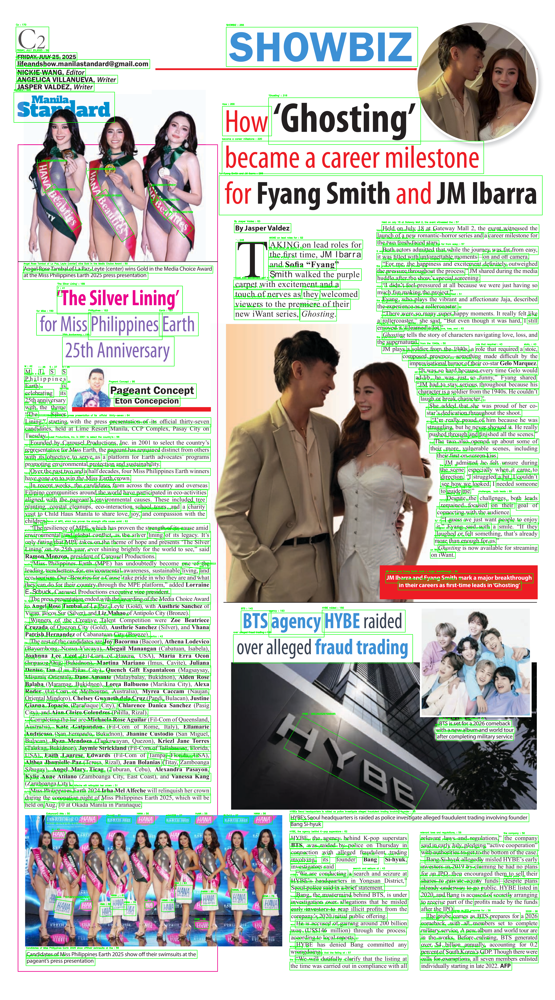

In [50]:
image_path = "./Label Studio/imgs/page_60.png"
# Run OCR
results = reader.readtext(image_path, text_threshold= 0, width_ths = 1)

# Annotate and display
img_result = draw_ocr_annotations(image_path, results)

In [53]:

API_KEY = os.getenv("API_KEY")

img_for_prompt = Image.open(img_result)

genai.configure(api_key=API_KEY) 

json_sample = {
    "values" : [
          {
        "type" : "headline",
        "text" : "nLOUSe tO OMEN DicamM to pulDllic",
        },
        {
        "type": "subheadline",
        "text": "Senate minority bloc backs more transparency to end corruption",
        }
    
    ]
}
prompt = [
    img_for_prompt,
    f""" 
    Can you please help me identify the headlines and subheadlines of each article in this newspaper image? Return them in the same json format that I will provide. Ensure that each object only contains the type (headlines, subheadlines) and the text itself.:
    {json.dumps(json_sample)}
    """
]
model = genai.GenerativeModel("models/gemini-2.5-flash")
response = model.generate_content(prompt)

print(response.text.strip("```json"))






{
  "values": [
    {
      "type": "headline",
      "text": "The Silver Lining' for Miss Philippines Earth 25th Anniversary"
    },
    {
      "type": "subheadline",
      "text": "Founded by Carousel Productions, Inc. in 2001 to select the country's representative for Miss Earth, the pageant has remained distinct from others with its objective, to serve as a platform for Earth advocates, promoting environmental protection and sustainability."
    },
    {
      "type": "subheadline",
      "text": "Candidates of Miss Philippines Earth 2025 show off their swimsuits at the pageant's press presentation"
    },
    {
      "type": "headline",
      "text": "How 'Ghosting' became a career milestone for Fyang Smith and JM Ibarra"
    },
    {
      "type": "subheadline",
      "text": "Held on July 18 at Gateway Mall 2, the event witnessed the launch of a new romantic-horror series and a career milestone for the two fresh-faced stars."
    },
    {
      "type": "subheadline",
      "te

In [54]:
gemini_output = json.loads(response.text.strip("```json"))
draw_annotations_from_gemini_with_ocr(image_path, gemini_output, results)






Best Single Line: 'The Silver Lining'
Best Height: 189
New Target Text:  for Miss Philippines Earth 25th Anniversary




Best Single Line: for Miss
Best Height: 150
New Target Text: Founded by Carousel Productions, Inc. in 2001 to select the country's representative  Earth, the pageant has remained distinct from others with its objective, to serve as a platform for Earth advocates, promoting environmental protection and sustainability.




Best Single Line: Earth
Best Height: 157
New Target Text: Candidates of Miss Philippines  2025 show off their swimsuits at the pageant's press presentation




Best Single Line: 'Ghosting'
Best Height: 316
New Target Text: How  became a career milestone for Fyang Smith and JM Ibarra




Best Single Line: Held on July 18 at Gateway Mall 2, the event witnessed the
Best Height: 57
New Target Text:  launch of a new romantic-horror series and a career milestone for the two fresh-faced stars.




Best Single Line: 'Ghosting'
Best Height: 316
New Target

{'values': [{'headline': "The Silver Lining' for Miss Philippines Earth 25th Anniversary",
   'subheadline': "Candidates of Miss Philippines Earth 2025 show off their swimsuits at the pageant's press presentation",
   'headline_coord': [246, 1930, 1340, 2471],
   'subheadline_coord': [175, 2110, 1340, 6518]},
  {'headline': "How 'Ghosting' became a career milestone for Fyang Smith and JM Ibarra",
   'subheadline': "JM Ibarra and Fyang Smith mark a major breakthrough in their careers as first-time leads in 'Ghosting'",
   'headline_coord': [1480, 659, 3664, 1451],
   'subheadline_coord': [633, 659, 2842, 1633]},
  {'headline': 'BTS agency HYBE raided over alleged fraud trading',
   'subheadline': "HYBE's Seoul headquarters is raided as police investigate alleged fraudulent trading involving founder Bang Si-hyuk",
   'headline_coord': [1576, 4117, 2788, 4475],
   'subheadline_coord': [1957, 5492, 3638, 5834]}]}